In [2]:
!pip install mrcnn
!pip install clint
!pip install crontab
!pip install tablib
!pip install coco
!pip install tensorflow==2.5.0

     |████████████████████████████████| 61kB 3.3MB/s 
  Created wheel for mrcnn: filename=mrcnn-0.2-cp37-none-any.whl size=54930 sha256=3da7ab5a3d93fadf0cad76fdbaf7961dd302e2eeaa0f3a617c4dbfc807b0ff2f
  Stored in directory: /root/.cache/pip/wheels/11/ed/28/e550ddc897c04c336b923eae4eb35c9aae993d20ce39d9cc40
Successfully built mrcnn
  Created wheel for clint: filename=clint-0.5.1-cp37-none-any.whl size=34472 sha256=fc91b58af8a05146a357d6f8358948aeac6868f9503d27238f8e69ceba6910e4
  Stored in directory: /root/.cache/pip/wheels/4f/e9/45/223565e5b1a4b09e12c6de6f8ba7c2c0e9127dec17cf830f83
  Created wheel for args: filename=args-0.1.0-cp37-none-any.whl size=3320 sha256=6ce8f8f388c7f84e40482e869897a24879afdd214b16b878ce76c157b4393313
  Stored in directory: /root/.cache/pip/wheels/58/54/ea/d995d18af68c057eb76b87b02c92bc66ac34d360ef141780f4
Successfully built clint args
  Created wheel for crontab: filename=crontab-0.23.0-cp37-none-any.whl size=20556 sha256=a81b99b73b07fc6d463be89b46544de65a053b7

In [ ]:
!pip install 'h5py==2.10.0' --force-reinstall

     |████████████████████████████████| 2.9MB 15.1MB/s 
     |████████████████████████████████| 15.7MB 170kB/s 
ERROR: lucid 0.3.10 requires umap-learn, which is not installed.
ERROR: tensorflow 1.15.2 has requirement gast==0.2.2, but you'll have gast 0.4.0 which is incompatible.
ERROR: lucid 0.3.10 has requirement numpy<=1.19, but you'll have numpy 1.21.0 which is incompatible.
ERROR: kapre 0.3.5 has requirement tensorflow>=2.0.0, but you'll have tensorflow 1.15.2 which is incompatible.
ERROR: google-colab 1.0.0 has requirement six~=1.15.0, but you'll have six 1.16.0 which is incompatible.
ERROR: datascience 0.10.6 has requirement folium==0.2.1, but you'll have folium 0.8.3 which is incompatible.
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
  Found existing installation: six 1.15.0
    Uninstalling six-1.15.0:
      Successfully uninstalled six-1.15.0
  Found existing installation: numpy 1.19.5
    Uninstalling 

In [1]:
!pip3 install git+https://github.com/philferriere/cocoapi.git#subdirectory=PythonAPI

  Cloning https://github.com/philferriere/cocoapi.git to /tmp/pip-req-build-jkv10583
  Running command git clone -q https://github.com/philferriere/cocoapi.git /tmp/pip-req-build-jkv10583
  Created wheel for pycocotools: filename=pycocotools-2.0-cp37-cp37m-linux_x86_64.whl size=264134 sha256=c4e31079a272d3e8b4c16281604cc546bef1b9c57f6b0b9ede3f6856dde17160
  Stored in directory: /tmp/pip-ephem-wheel-cache-topn0w6r/wheels/69/2b/12/2fa959e49f73d26cff202c2f4e5079096c9c57c8a8509fd75c
Successfully built pycocotools
  Found existing installation: pycocotools 2.0.2
    Uninstalling pycocotools-2.0.2:
      Successfully uninstalled pycocotools-2.0.2


In [ ]:
!python3 Mask_RCNN/TACO/download.py

Note. If for any reason the connection is broken. Just call me again and I will start where I left.
Finished


In [3]:
! git clone https://github.com/matterport/Mask_RCNN.git
! git clone https://github.com/pedropro/TACO.git

Cloning into 'Mask_RCNN'...
remote: Enumerating objects: 956, done.
remote: Total 956 (delta 0), reused 0 (delta 0), pack-reused 956
Receiving objects: 100% (956/956), 125.23 MiB | 35.01 MiB/s, done.
Resolving deltas: 100% (562/562), done.
Cloning into 'TACO'...
remote: Enumerating objects: 400, done.
remote: Counting objects: 100% (130/130), done.
remote: Compressing objects: 100% (86/86), done.
remote: Total 400 (delta 93), reused 78 (delta 44), pack-reused 270
Receiving objects: 100% (400/400), 64.14 MiB | 24.47 MiB/s, done.
Resolving deltas: 100% (244/244), done.


In [ ]:
import os
os.kill(os.getpid(), 9)

In [4]:
%tensorflow_version 1.x

TensorFlow 1.x selected.


In [5]:
import os
import sys
import itertools
import math
import logging
import json
import re
import random
from collections import OrderedDict
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.lines as linesa
from matplotlib.patches import Polygon
import skimage.io

# Root directory of the project
ROOT_DIR = os.path.abspath("Mask_RCNN/")

# Importing Mask RCNN 
# Mask RCNN is aimed to solve instance segmentation problems in ML #
# give it an image, it gives you the object bounding boxes, classes, and masks #
# box: border of object, class: identifies what kind of object it is #
# mask: creates precise outline on image to help identify other objects near #
sys.path.append(ROOT_DIR)  # To find local version of the library
from mrcnn import utils
import mrcnn.model as modellib
from mrcnn import visualize
from mrcnn.visualize import display_images
from mrcnn.config import Config
from mrcnn.model import log

import seaborn as sns; sns.set()

%matplotlib inline

Using TensorFlow backend.


In [6]:
# Fetching the root directory
# full path of root directory #
# /downloads/download.txt
# /root/home/downloads/download.txt
# ../: looking at the parent directory
ROOT_DIR = os.path.abspath("Mask_RCNN")

# Filtered to ignore and never print matching warnings #
# Other options: default, error, always, module, once #
import warnings
warnings.filterwarnings("ignore")

# Heading to the coco directory
# coco is a large dataset to help with object detection #
sys.path.append(os.path.join(ROOT_DIR, "samples/coco/"))

#importing coco.py
# import coco
import pycocotools.coco as coco
# from samples.coco import coco
# matplotlib library is used for creating static, animated, and interactive visualizations #
%matplotlib inline

In [10]:
## Load Dataset
import csv
import Mask_RCNN.TACO.detector.dataset as dataset

# Load class map - these tables map the original TACO classes to your desired class system
# and allow you to discard classes that you don't want to include.
class_map = {}
with open("Mask_RCNN/TACO/detector/taco_config/map_1.csv") as csvfile:
    reader = csv.reader(csvfile)
    class_map = {row[0]:row[1] for row in reader}

# Load full dataset or a subset
TACO_DIR = "Mask_RCNN/TACO/data"
round = None # Split number: If None, loads full dataset else if int > 0 selects split no 
subset = "train" # Used only when round !=None, Options: ('train','val','test') to select respective subset
dataset = dataset.Taco()
taco = dataset.load_taco(TACO_DIR, round, subset, class_map=class_map, return_taco=True)

# Must call before using the dataset
dataset.prepare()

print("Class Count: {}".format(dataset.num_classes))
for i, info in enumerate(dataset.class_info):
    print("{:3}. {:50}".format(i, info['name']))

creating index...
index created!
Number of images used: 1500
Class Count: 2
  0. BG                                                
  1. Litter                                            


In [11]:
print(taco.dataset['images'])

[{'id': 0, 'width': 1537, 'height': 2049, 'file_name': 'batch_1/000006.jpg', 'license': None, 'flickr_url': 'https://farm66.staticflickr.com/65535/33978196618_e30a59e0a8_o.png', 'coco_url': None, 'date_captured': None, 'flickr_640_url': 'https://farm66.staticflickr.com/65535/33978196618_632623b4fc_z.jpg'}, {'id': 1, 'width': 1537, 'height': 2049, 'file_name': 'batch_1/000008.jpg', 'license': None, 'flickr_url': 'https://farm66.staticflickr.com/65535/47803331152_ee00755a2e_o.png', 'coco_url': None, 'date_captured': None, 'flickr_640_url': 'https://farm66.staticflickr.com/65535/47803331152_19beae025a_z.jpg'}, {'id': 2, 'width': 1537, 'height': 2049, 'file_name': 'batch_1/000010.jpg', 'license': None, 'flickr_url': 'https://farm66.staticflickr.com/65535/40888872753_08ffb24902_o.png', 'coco_url': None, 'date_captured': None, 'flickr_640_url': 'https://farm66.staticflickr.com/65535/40888872753_631ab0f441_z.jpg'}, {'id': 3, 'width': 2049, 'height': 1537, 'file_name': 'batch_1/000019.jpg', 'l

In [12]:
from mrcnn.config import Config
class TacoTestConfig(Config):
    NAME = "taco"
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    DETECTION_MIN_CONFIDENCE = 0.3
    NUM_CLASSES = dataset.num_classes
#     IMAGE_MAX_DIM = 1024
#     IMAGE_MIN_DIM = 1024
#     IMAGE_RESIZE_MODE = "square"
config = TacoTestConfig()
config.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.3
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                14
IMAGE_MIN_DIM                  800
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE                     [28, 28]
MAX_GT_INSTA

In [13]:
# Create model objects in inference mode.
# inference mode means we are taking live data points to calculate an output #
# model dir is where the trained model is saved #
# config: exposes a config class, using those settings #
model = modellib.MaskRCNN(mode="inference", model_dir='mask_rcnn_coco.hy', config=config)

# Load weights trained on MS-COCO
# The trained objects that are used for accuracy #
# by_name: weights are loaded into layers only if the share the same name #
model.load_weights('Mask_RCNN/mask_rcnn_taco_0100.h5', by_name=True, exclude=["mrcnn_bbox_fc","mrcnn_class_logits","mrcnn_mask"])

Instructions for updating:
If using Keras pass *_constraint arguments to layers.


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Instructions for updating:
box_ind is deprecated, use box_indices instead


Instructions for updating:
Use `tf.cast` instead.


OSError: ignored

In [ ]:
dataset_path = 'Mask_RCNN/TACO/data'
anns_file_path = dataset_path + '/' + 'annotations.json'

# Read annotations
with open(anns_file_path, 'r') as f:
    dataset = json.loads(f.read())

categories = dataset['categories']
anns = dataset['annotations']
imgs = dataset['images']
nr_cats = len(categories)
nr_annotations = len(anns)
nr_images = len(imgs)

# Load categories and super categories
cat_names = []
super_cat_names = []
super_cat_ids = {}
super_cat_last_name = ''
nr_super_cats = 0
for cat_it in categories:
    cat_names.append(cat_it['name'])
    super_cat_name = cat_it['supercategory']
    # Adding new supercat
    if super_cat_name != super_cat_last_name:
        super_cat_names.append(super_cat_name)
        super_cat_ids[super_cat_name] = nr_super_cats
        super_cat_last_name = super_cat_name
        nr_super_cats += 1

print('Number of super categories:', nr_super_cats)
print('Number of categories:', nr_cats)
print('Number of annotations:', nr_annotations)
print('Number of images:', nr_images)

Number of super categories: 28
Number of categories: 60
Number of annotations: 4784
Number of images: 1500


In [ ]:
class_names = []
for category in dataset['categories']:
  class_names.append(category['name'])
print(class_names)

['Aluminium foil', 'Battery', 'Aluminium blister pack', 'Carded blister pack', 'Other plastic bottle', 'Clear plastic bottle', 'Glass bottle', 'Plastic bottle cap', 'Metal bottle cap', 'Broken glass', 'Food Can', 'Aerosol', 'Drink can', 'Toilet tube', 'Other carton', 'Egg carton', 'Drink carton', 'Corrugated carton', 'Meal carton', 'Pizza box', 'Paper cup', 'Disposable plastic cup', 'Foam cup', 'Glass cup', 'Other plastic cup', 'Food waste', 'Glass jar', 'Plastic lid', 'Metal lid', 'Other plastic', 'Magazine paper', 'Tissues', 'Wrapping paper', 'Normal paper', 'Paper bag', 'Plastified paper bag', 'Plastic film', 'Six pack rings', 'Garbage bag', 'Other plastic wrapper', 'Single-use carrier bag', 'Polypropylene bag', 'Crisp packet', 'Spread tub', 'Tupperware', 'Disposable food container', 'Foam food container', 'Other plastic container', 'Plastic glooves', 'Plastic utensils', 'Pop tab', 'Rope & strings', 'Scrap metal', 'Shoe', 'Squeezable tube', 'Plastic straw', 'Paper straw', 'Styrofoam

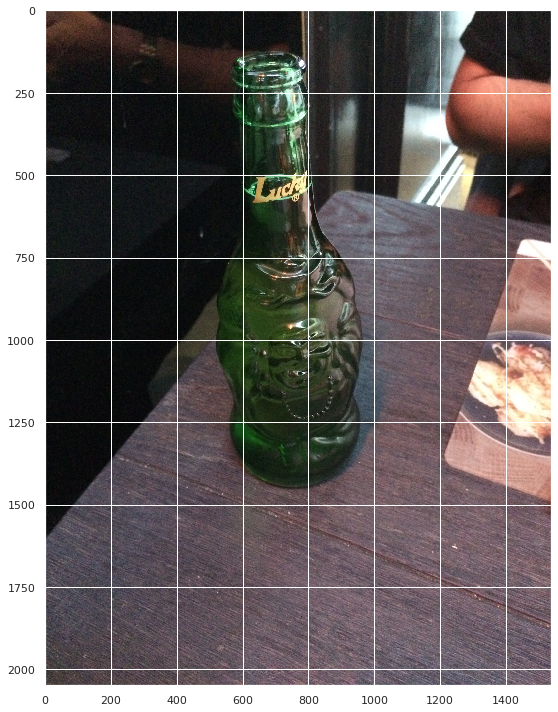

In [ ]:
# load an image #
#skimage helps with image processing on a computer #
image = skimage.io.imread('33978196618_e30a59e0a8_o.jfif')

# original image
# width and height in inches #
plt.figure(figsize=(12,10))

# show image #
skimage.io.imshow(image)

In [ ]:
# Run detection
# use mrcnn.model.detect to detect any objects in the image #
# verbose = 1 creates an animated progress bar when detecting the image #
results = model.detect([image], verbose=1)

Processing 1 images
image                    shape: (2049, 1537, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  149.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 2049.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32



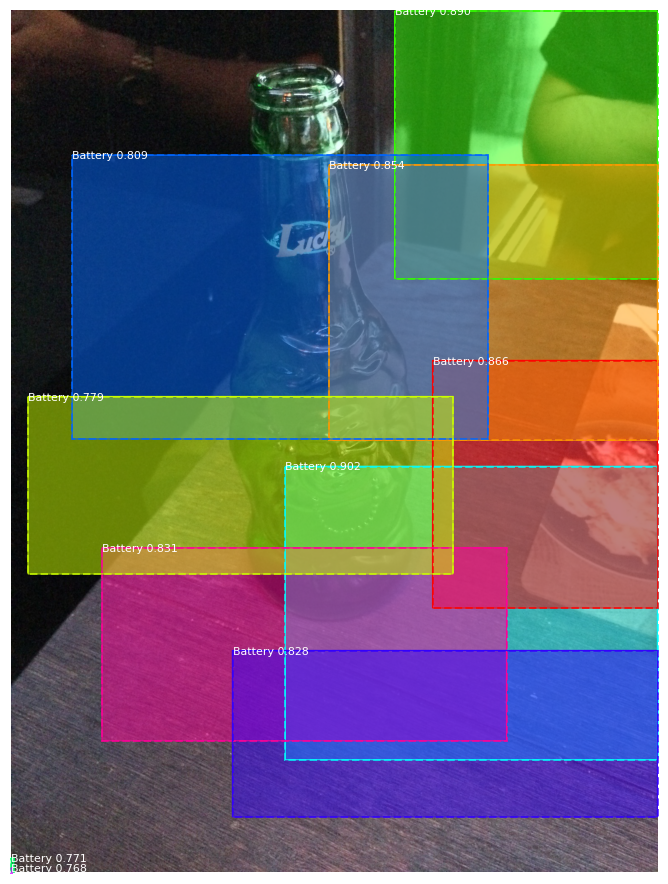

In [ ]:
# Visualize results
# index 0: location of results. Multidimentional array of the bounding box coordinates #
r = results[0]

visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], class_names, r['scores'])

loading annotations into memory...
Done (t=0.05s)
creating index...
index created!
batch_11/000028.jpg


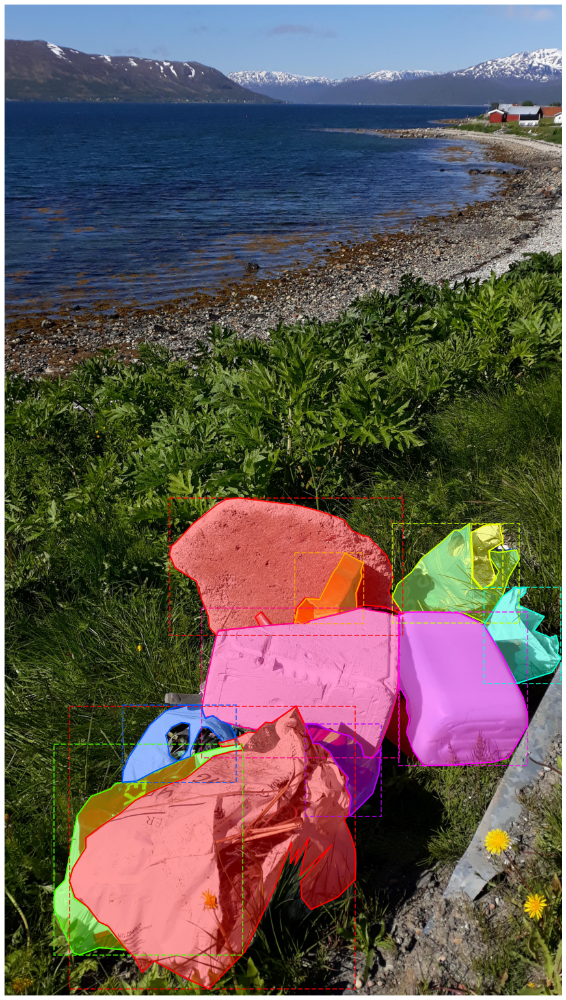

In [ ]:
from PIL import Image, ExifTags
from pycocotools.coco import COCO
from matplotlib.patches import Polygon, Rectangle
from matplotlib.collections import PatchCollection
import colorsys
import random
import pylab

# User settings
image_filepath = 'batch_11/000028.jpg'
pylab.rcParams['figure.figsize'] = (28,28)
####################

# Obtain Exif orientation tag code
for orientation in ExifTags.TAGS.keys():
    if ExifTags.TAGS[orientation] == 'Orientation':
        break

# Loads dataset as a coco object
coco = COCO(anns_file_path)

# Find image id
img_id = -1
for img in imgs:
    if img['file_name'] == image_filepath:
        img_id = img['id']
        break

# Show image and corresponding annotations
if img_id == -1:
    print('Incorrect file name')
else:

    # Load image
    print(image_filepath)
    I = Image.open(dataset_path + '/' + image_filepath)

    # Load and process image metadata
    if I._getexif():
        exif = dict(I._getexif().items())
        # Rotate portrait and upside down images if necessary
        if orientation in exif:
            if exif[orientation] == 3:
                I = I.rotate(180,expand=True)
            if exif[orientation] == 6:
                I = I.rotate(270,expand=True)
            if exif[orientation] == 8:
                I = I.rotate(90,expand=True)

    # Show image
    fig,ax = plt.subplots(1)
    plt.axis('off')
    plt.imshow(I)

    # Load mask ids
    annIds = coco.getAnnIds(imgIds=img_id, catIds=[], iscrowd=None)
    anns_sel = coco.loadAnns(annIds)

    # Show annotations
    for ann in anns_sel:
        color = colorsys.hsv_to_rgb(np.random.random(),1,1)
        for seg in ann['segmentation']:
            poly = Polygon(np.array(seg).reshape((int(len(seg)/2), 2)))
            p = PatchCollection([poly], facecolor=color, edgecolors=color,linewidths=0, alpha=0.4)
            ax.add_collection(p)
            p = PatchCollection([poly], facecolor='none', edgecolors=color, linewidths=2)
            ax.add_collection(p)
        [x, y, w, h] = ann['bbox']
        rect = Rectangle((x,y),w,h,linewidth=2,edgecolor=color,
                         facecolor='none', alpha=0.7, linestyle = '--')
        ax.add_patch(rect)

    plt.show()



loading annotations into memory...
Done (t=0.23s)
creating index...
index created!
Number of images found:  322


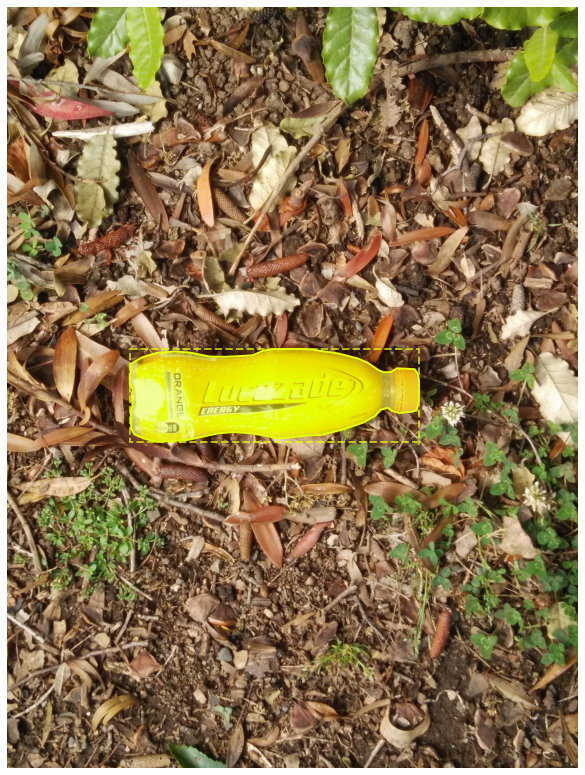

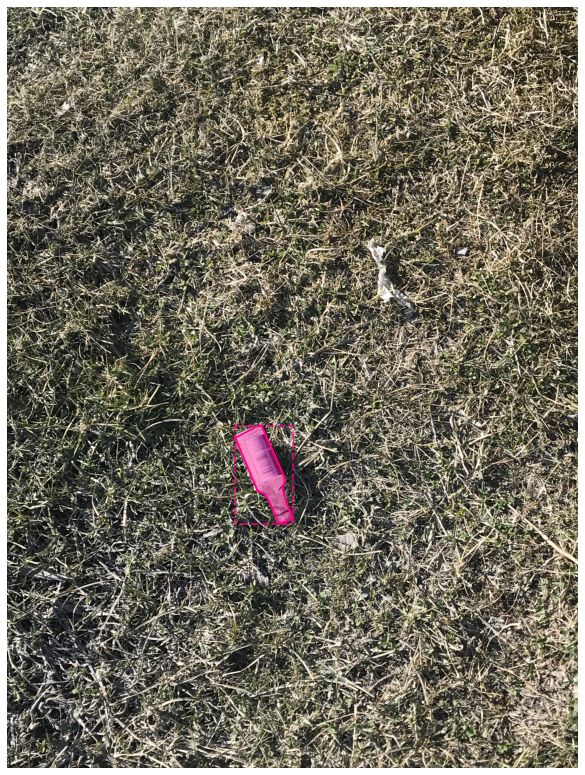

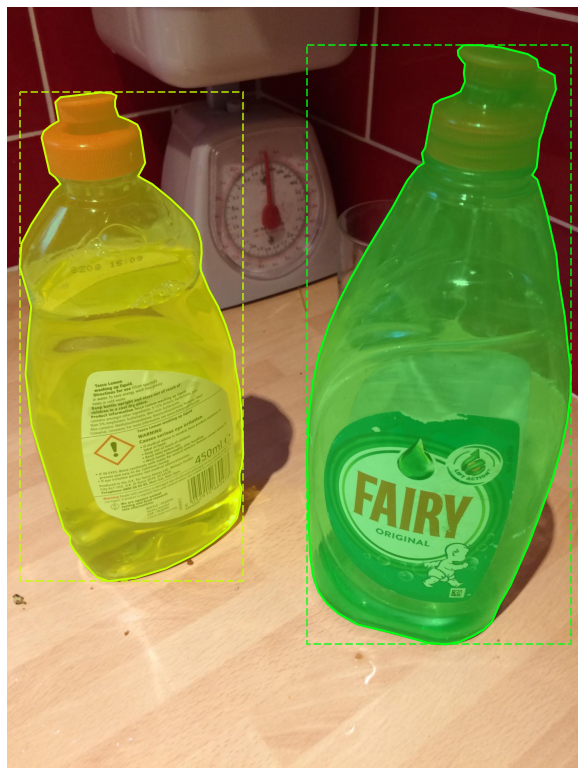

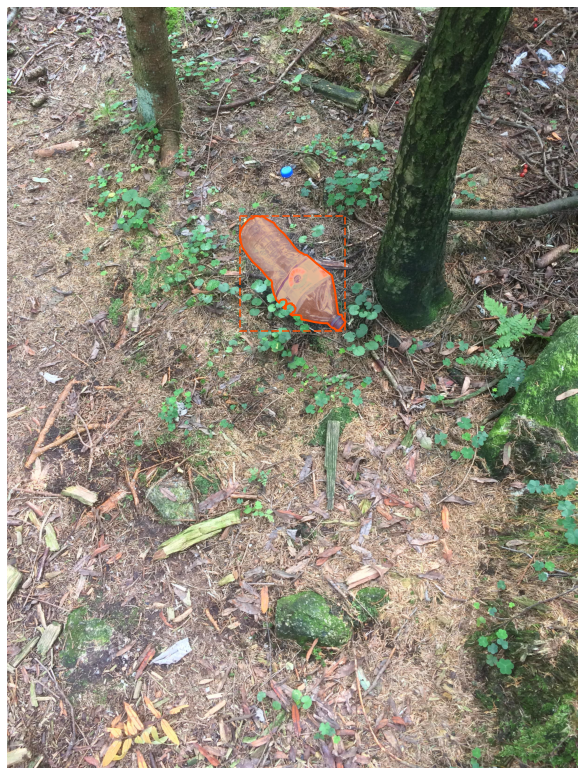

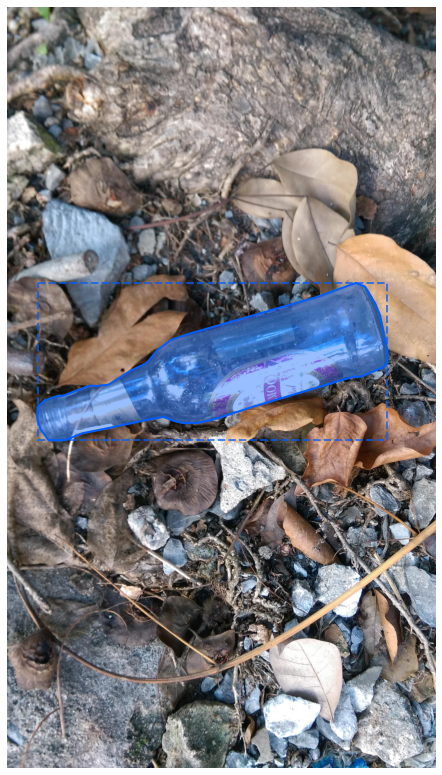

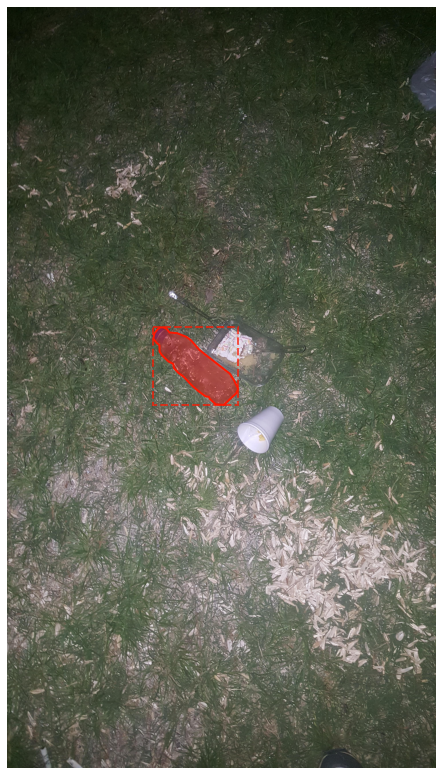

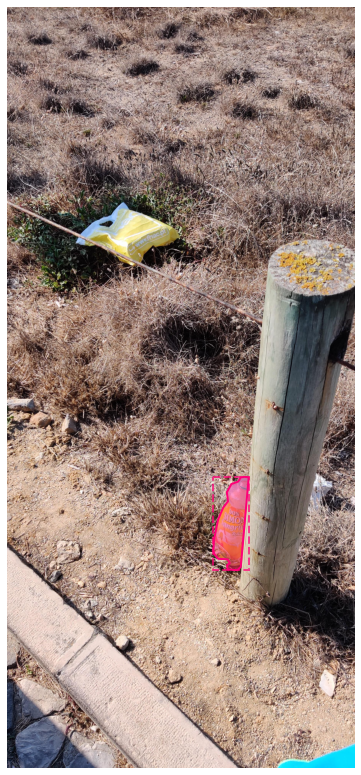

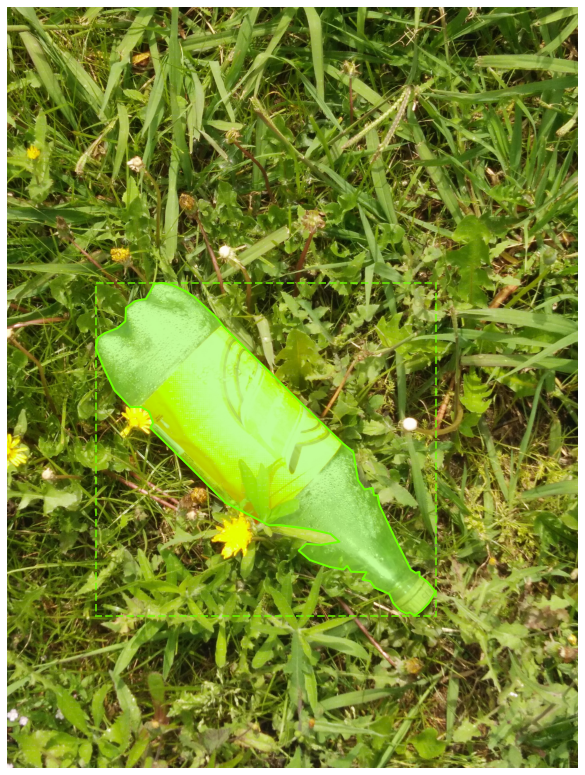

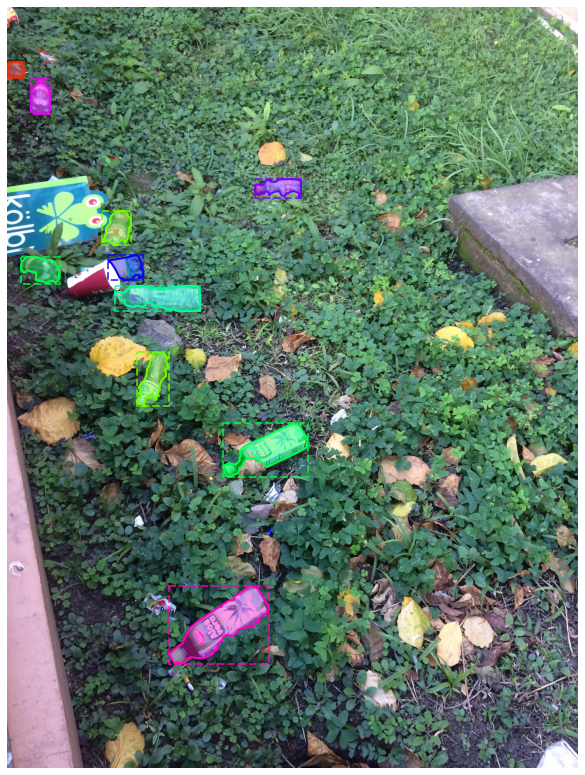

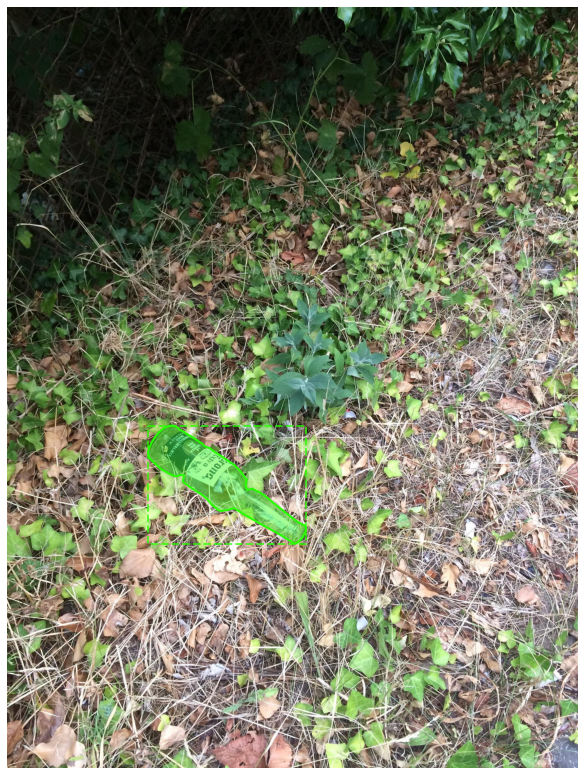

In [ ]:
from PIL import Image, ExifTags
from pycocotools.coco import COCO
from matplotlib.patches import Polygon, Rectangle
from matplotlib.collections import PatchCollection
import colorsys
import random
import pylab

# User settings
nr_img_2_display = 10
category_name = 'Bottle'#  --- Insert the name of one of the categories or super-categories above
pylab.rcParams['figure.figsize'] = (14,14)
####################

# Obtain Exif orientation tag code
for orientation in ExifTags.TAGS.keys():
    if ExifTags.TAGS[orientation] == 'Orientation':
        break

# Loads dataset as a coco object
coco = COCO(anns_file_path)

# Get image ids
imgIds = []
catIds = coco.getCatIds(catNms=[category_name])
if catIds:
    # Get all images containing an instance of the chosen category
    imgIds = coco.getImgIds(catIds=catIds)
else:
    # Get all images containing an instance of the chosen super category
    catIds = coco.getCatIds(supNms=[category_name])
    for catId in catIds:
        imgIds += (coco.getImgIds(catIds=catId))
    imgIds = list(set(imgIds))

nr_images_found = len(imgIds) 
print('Number of images found: ',nr_images_found)

# Select N random images
random.shuffle(imgIds)
imgs = coco.loadImgs(imgIds[0:min(nr_img_2_display,nr_images_found)])

for img in imgs:
    image_path = dataset_path + '/' + img['file_name']
    # Load image
    I = Image.open(image_path)
    
    # Load and process image metadata
    if I._getexif():
        exif = dict(I._getexif().items())
        # Rotate portrait and upside down images if necessary
        if orientation in exif:
            if exif[orientation] == 3:
                I = I.rotate(180,expand=True)
            if exif[orientation] == 6:
                I = I.rotate(270,expand=True)
            if exif[orientation] == 8:
                I = I.rotate(90,expand=True)
    
    # Show image
    fig,ax = plt.subplots(1)
    plt.axis('off')
    plt.imshow(I)

    # Load mask ids
    annIds = coco.getAnnIds(imgIds=img['id'], catIds=catIds, iscrowd=None)
    anns_sel = coco.loadAnns(annIds)
    
    # Show annotations
    for ann in anns_sel:
        color = colorsys.hsv_to_rgb(np.random.random(),1,1)
        for seg in ann['segmentation']:
            poly = Polygon(np.array(seg).reshape((int(len(seg)/2), 2)))
            p = PatchCollection([poly], facecolor=color, edgecolors=color,linewidths=0, alpha=0.4)
            ax.add_collection(p)
            p = PatchCollection([poly], facecolor='none', edgecolors=color, linewidths=2)
            ax.add_collection(p)
        [x, y, w, h] = ann['bbox']
        rect = Rectangle((x,y),w,h,linewidth=2,edgecolor=color,
                         facecolor='none', alpha=0.7, linestyle = '--')
        ax.add_patch(rect)

    plt.show()


In [ ]:
pip install 'keras==2.1.6' --force-reinstall

  Using cached https://files.pythonhosted.org/packages/54/e8/eaff7a09349ae9bd40d3ebaf028b49f5e2392c771f294910f75bb608b241/Keras-2.1.6-py2.py3-none-any.whl
  Using cached https://files.pythonhosted.org/packages/3f/03/c3526fb4e79a793498829ca570f2f868204ad9a8040afcd72d82a8f121db/numpy-1.21.0-cp37-cp37m-manylinux_2_12_x86_64.manylinux2010_x86_64.whl
  Using cached https://files.pythonhosted.org/packages/7a/a5/393c087efdc78091afa2af9f1378762f9821c9c1d7a22c5753fb5ac5f97a/PyYAML-5.4.1-cp37-cp37m-manylinux1_x86_64.whl
  Using cached https://files.pythonhosted.org/packages/d9/5a/e7c31adbe875f2abbb91bd84cf2dc52d792b5a01506781dbcf25c91daf11/six-1.16.0-py2.py3-none-any.whl
  Using cached https://files.pythonhosted.org/packages/e5/8e/c36cb359b185d56af8fe22a8a6db58af1e98be902677d032b87018763dd0/h5py-3.3.0-cp37-cp37m-manylinux_2_12_x86_64.manylinux2010_x86_64.whl
  Using cached https://files.pythonhosted.org/packages/b2/85/b00f13b52d079b5625e1a12330fc6453c947a482ff667a907c7bc60ed220/scipy-1.7.0-cp37-

In [ ]:
!pip install tensorflow==2.1.0

     |████████████████████████████████| 421.8MB 32kB/s 
     |████████████████████████████████| 51kB 4.6MB/s 
     |████████████████████████████████| 26.1MB 122kB/s 
     |████████████████████████████████| 3.9MB 40.0MB/s 
     |████████████████████████████████| 450kB 46.3MB/s 
  Created wheel for gast: filename=gast-0.2.2-cp37-none-any.whl size=7557 sha256=428ddb8e9e96df716d0f80abba7d26c449ae7df96874215239fdaa1b9379574b
  Stored in directory: /root/.cache/pip/wheels/5c/2e/7e/a1d4d4fcebe6c381f378ce7743a3ced3699feb89bcfbdadadd
Successfully built gast
ERROR: tensorflow-probability 0.12.1 has requirement gast>=0.3.2, but you'll have gast 0.2.2 which is incompatible.
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
  Found existing installation: gast 0.4.0
    Uninstalling gast-0.4.0:
      Successfully uninstalled gast-0.4.0
  Found existing installation: scipy 1.7.0
    Uninstalling scipy-1.7.0:
      Successfully unins

In [ ]:
!pip uninstall tf-nightly

In [ ]:
!pip uninstall tf-estimate-nightly


In [ ]:
!pip uninstall tensorflow

Uninstalling tensorflow-2.1.0:
  Would remove:
    /usr/local/bin/estimator_ckpt_converter
    /usr/local/bin/saved_model_cli
    /usr/local/bin/tensorboard
    /usr/local/bin/tf_upgrade_v2
    /usr/local/bin/tflite_convert
    /usr/local/bin/toco
    /usr/local/bin/toco_from_protos
    /usr/local/lib/python3.7/dist-packages/tensorflow-2.1.0.dist-info/*
    /usr/local/lib/python3.7/dist-packages/tensorflow/*
    /usr/local/lib/python3.7/dist-packages/tensorflow_core/*
Proceed (y/n)? y
  Successfully uninstalled tensorflow-2.1.0


In [ ]:
!pip install tensorflow

     |████████████████████████████████| 454.3MB 20kB/s 
     |████████████████████████████████| 471kB 56.1MB/s 
     |████████████████████████████████| 14.8MB 208kB/s 
     |████████████████████████████████| 6.0MB 20.5MB/s 
     |████████████████████████████████| 4.0MB 51.9MB/s 
ERROR: datascience 0.10.6 has requirement folium==0.2.1, but you'll have folium 0.8.3 which is incompatible.
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
  Found existing installation: tensorflow-estimator 2.1.0
    Uninstalling tensorflow-estimator-2.1.0:
      Successfully uninstalled tensorflow-estimator-2.1.0
  Found existing installation: numpy 1.21.0
    Uninstalling numpy-1.21.0:
      Successfully uninstalled numpy-1.21.0
  Found existing installation: tensorboard 2.1.1
    Uninstalling tensorboard-2.1.1:
      Successfully uninstalled tensorboard-2.1.1
  Found existing installation: h5py 3.3.0
    Uninstalling h5py-3.3.0:
      S

In [ ]:
!pip list | grep tf

In [ ]:
!pip install tensorflow --upgrade --force-reinstall

  Using cached https://files.pythonhosted.org/packages/aa/fd/993aa1333eb54d9f000863fe8ec61e41d12eb833dea51484c76c038718b5/tensorflow-2.5.0-cp37-cp37m-manylinux2010_x86_64.whl
  Using cached https://files.pythonhosted.org/packages/ee/ff/48bde5c0f013094d729fe4b0316ba2a24774b3ff1c52d924a8a4cb04078a/six-1.15.0-py2.py3-none-any.whl
     |████████████████████████████████| 71kB 6.2MB/s 
     |████████████████████████████████| 51kB 4.8MB/s 
  Using cached https://files.pythonhosted.org/packages/b6/48/583c032b79ae5b3daa02225a675aeb673e58d2cb698e78510feceb11958c/gast-0.4.0-py3-none-any.whl
  Using cached https://files.pythonhosted.org/packages/44/f5/7feea02a3fb54d5db827ac4b822a7ba8933826b36de21880518250b8733a/tensorboard-2.5.0-py3-none-any.whl
     |████████████████████████████████| 4.0MB 56.9MB/s 
     |████████████████████████████████| 1.2MB 41.7MB/s 
     |████████████████████████████████| 61kB 4.7MB/s 
     |████████████████████████████████| 133kB 59.4MB/s 
  Using cached https://files.pytho

In [14]:
!python3 -W ignore Mask_RCNN/TACO/detector/detector.py train --model=coco --dataset=Mask_RCNN/TACO/data --class_map=Mask_RCNN/TACO/detector/taco_config/map_10.csv --round 0

Using TensorFlow backend.
Command:  train
Model:  coco
Dataset:  Mask_RCNN/TACO/data
Logs:  /content/models/logs
Traceback (most recent call last):
  File "Mask_RCNN/TACO/detector/detector.py", line 230, in <module>
    dataset_train.load_taco(args.dataset, args.round, "train", class_map=class_map, auto_download=None)
  File "/content/Mask_RCNN/TACO/detector/dataset.py", line 40, in load_taco
    assert os.path.isfile(ann_filepath)
AssertionError


In [ ]:
!python3 -W ignore Mask_RCNN/TACO/detector/detector.py train  --dataset=Mask_RCNN/TACO/data --model=<model_name> --class_map=./taco_config/map_10.csv --round 0